#                          **Trending Jobs(Project 3)**                  

###  Nitin Jethwani                                                                                                       


#### Datasets:
- Job Description Dataset(Scraped Indeed portal for the job description using Beautifulsoup,Selenium)
- Resume Dataset(Dataset taken from Kaggle)-
- Attached the csv('UpdatedResumeDataSet.csv') in the documents.

#### Instructions of the packages included in the code
#### Mallet
- Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
- You only need to download the zipfile, unzip it and provide the path to mallet in the unzipped directory to gensim.models.wrappers.LdaMallet.

#### Required Installations
- nltk
- Gensim
- pyLDAvis
- Spacy
- sklearn
- chromedriver


# 1) Webscraping and EDA
## Dataset1(Fetching the Job descriptions)


#### We have used Indeedjobs India to scrape the jobs of Datascience in Hyderabad,we have made use of selenium and beautifulsoup to extract the data.

In [1]:
#importing libraries

import pandas as pd
import numpy as np
from pprint import pprint
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
import spacy
import warnings
import nltk
nltk.download('wordnet')
warnings.filterwarnings("ignore",category=DeprecationWarning)
# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy for lemmatization
import spacy

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/nitinjethwani/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [2]:
# If chromedriver is not installed please uncomment the below lines and  run this code 

#from webdriver_manager.chrome import ChromeDriverManager
#options = webdriver.ChromeOptions()
#options.add_argument('headless')
#driver = webdriver.Chrome(ChromeDriverManager().install())

In [ ]:
# If chromedriver is already installed  use this code
from selenium import webdriver#Using selenium to scrape the data 
import pandas as pd #Using pandas to convert the extracted fields to a dataframe
from bs4 import BeautifulSoup#Using beautifulsoup to extract the required fields from jobpostings

options = webdriver.ChromeOptions()
driver = webdriver.Chrome("./chromedriver")

In [ ]:

infodf = pd.DataFrame(columns=["JobTitle","Location","Company","Salary","Description"])#Initialising a dataframe to extract the mentioned fields

for i in range(0,400,10):#Going through all the pages and respective jobs with an increment of 10 as observed while going to the necxt pages
    driver.get('https://www.indeed.co.in/jobs?q=data+science&l=Hyderabad%2C+Telangana&start='+str(i))
    driver.implicitly_wait(4)
    
    for i in driver.find_elements_by_class_name('result'):#Each job post is contained inside this div and looping through all the job posts and extracting the required fields for all the job posts
        soup = BeautifulSoup(i.get_attribute('innerHTML'),'html.parser')#Extracting all the required fields with beautifulsoup for all the job posts
        try:
            jobtitle = soup.find("a",class_="jobtitle").text.replace("\n","")#Extracting the jobtitle 

        except:
            jobtitle = 'Notmentioned'
        try:
            location = soup.find(class_="location").text#Extracting the location
        except:
            location = 'Notmentioned'
        try:
            company = soup.find(class_="company").text.replace("\n","").strip()#Extracting the company name
        except:
            company = 'Notmentioned'
        try:
            salary = soup.find(class_="salary").text.replace("\n","").strip()#Extracting the salary
        except:
            salary = 'Notmentioned'
        sum_div = i.find_elements_by_class_name("summary")[0]#But the summary is available only after clicking on the respective job post ,hence using selenium to click on it
        try:
            sum_div.click()
            
        except:
            close_button = driver.find_elements_by_class_name('popover-x-button-close')[0]#Closing the pop up message we get after going through few job posts
            close_button.click()
            sum_div.click()
        try:
            job_desc = driver.find_element_by_id('vjs-desc').text#Extracting the description 
        
        except:
                job_desc="Unable to extract"
            
        try:
            infodf = infodf.append({'JobTitle':jobtitle,'Location':location,"Company":company,"Salary":salary,"Description":job_desc},ignore_index=True)
        #Appending all the extracted fields to the data frame
        except:
            infodf=pd.read_csv("Hyderabad_Sahithi_Koppula.csv")
        

In [3]:
infodf=pd.read_csv("Hyderabad_Sahithi_Koppula.csv")

#### Extracting the output to Csv

In [15]:
#infodf.to_csv("Hyderabad_Sahithi_Koppula.csv",index=False)#Using the first extracted job description for further data analysis
#infodf

,JobTitle,Location,Company,Salary,Description
0,Data Scientist,"Hyderabad, Telangana",thoughtgreen technologies pvt ltd,"₹3,00,000 a year",The role of a DATA SCIENTIST / Computer Vision...
1,Referral- Data Engineering,"Hyderabad, Telangana",Deloitte,Notmentioned,SCAM ALERT: Caution against fraudulent job off...
2,Software Developer (Fresher Only),"Hyderabad, Telangana",Supremejobsolution,"₹23,000 - ₹25,000 a month","A Java, C#, .Net, C, Sybase and Oracle Softwar..."
3,Data Integration / ETL Developer,"Hyderabad, Telangana",ServiceNow,Notmentioned,Description:\nServiceNow is changing the way p...
4,Data Science Intern,"Hyderabad, Telangana",Microsoft,Notmentioned,"Microsoft India (R&D) Private Limited, a subsi..."
...,...,...,...,...,...
1495,Senior Analyst - Pricing | Thesis Company | 5-...,"Hyderabad, Telangana",Talent500,Notmentioned,Role Objective:\nThe Sr. Pricing Analyst – Adv...
1496,Big Data Developer | Applicable Assortment | 1...,"Hyderabad, Telangana",Talent500,Notmentioned,Associate Data Engineer Position\nOrganization...
1497,Senior Analyst - Pricing (Python OR R) | Steal...,"Hyderabad, Telangana",Talent500,Notmentioned,Role Objective:\nThe Sr. Pricing Analyst – Adv...
1498,Big Data Developer | X Marks The Spot | 1-3 Years,"Hyderabad, Telangana",Talent500,Notmentioned,Associate Data Engineer Position\nOrganization...


### Data Analysis

#### Finding the key hires of datascience from the extracted data

Company
Talent500                        500
Novartis                          69
Amazon Dev Center India - Hyd     47
Oracle                            31
ADCI HYD 13 SEZ                   30
Microsoft                         26
Micron                            20
AWS ProServe IN - Telangana       20
JPMorgan Chase Bank, N.A.         19
Gaian Solutions                   18
ICS Consultancy Services          17
Cognizant                         14
Apple                             10
ADCI HYD 16 SEZ                   10
ServiceNow                         9
WELLS FARGO BANK                   9
Deloitte                           9
PepsiCo                            9
Google                             8
AlignTech                          8
Name: JobTitle, dtype: int64


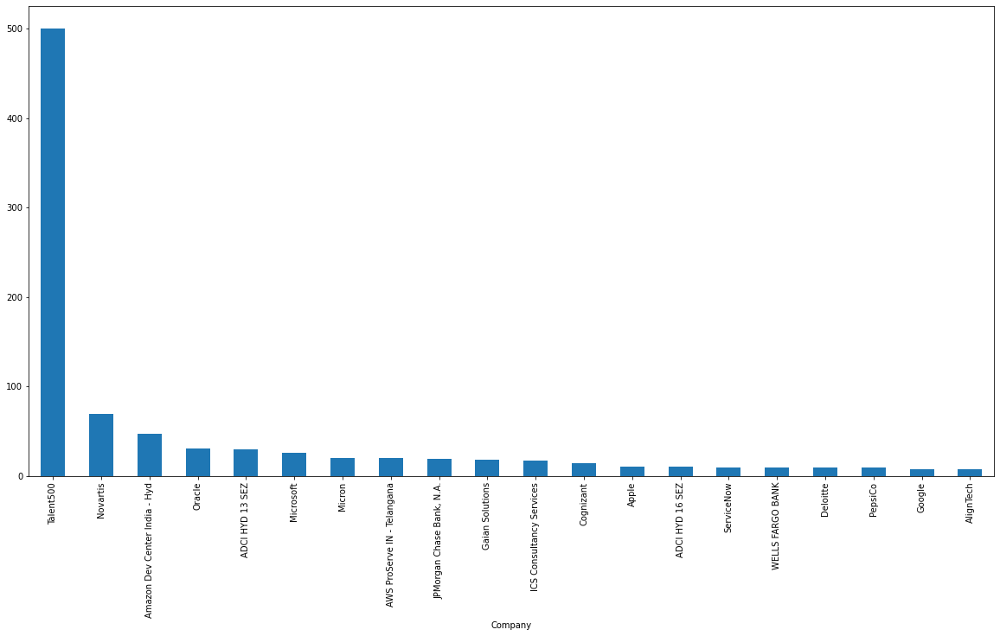

In [4]:
import numpy as np
import matplotlib.pyplot as plt
counts = infodf.groupby("Company").count()["JobTitle"].sort_values(ascending=False)[:20]
counts.plot(kind="bar",figsize=(20,10))
print(counts)

#### As the description does not contain a separate field for the skills that are required to categorize or aggregate ,we have used text analytics to find which technologies are frequent in the description of job summary 

In [5]:

def data(i):#Using this function to extract the words from description
    i = word_tokenize(i)#using tokenize to extract the words from description
    i = [word.lower() for word in i if word.isalpha() and len(word) > 2]#checking whether all characters in the string are alphabets 
    i = [word for word in i if word not in stword]
    return i

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/nitinjethwani/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/nitinjethwani/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


python      916
sql        1285
java        473
tableau     617
power       406
hadoop      473
aws         567
azure       369
dtype: int64


<AxesSubplot:>

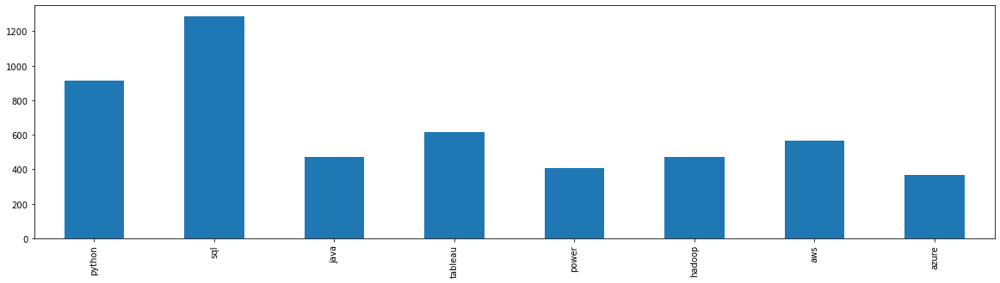

In [6]:
import nltk
from nltk import word_tokenize
nltk.download('stopwords')
nltk.download('punkt')

from nltk.corpus import stopwords
stword = stopwords.words('english')

descdf = infodf["Description"].apply(data)# Applying the data function on each description of the job posting to extract the words

from collections import Counter
res = descdf.apply(Counter).sum().items()#Finding how many times each word is repeated 
res = sorted(res, key=lambda kv: kv[1],reverse=True)
final = pd.Series({k: v for k, v in res})
skills = ["python","sql","java","tableau","power","hadoop","aws","azure"]##I wanted to study the repetition of key major datascience skills in the description

final_output = final.filter(items=skills)#filtering the output for our required skills 
print(final_output)
final_output.plot(kind='bar',figsize=(20,5))

In [7]:
# reading the csv
jobs = pd.read_csv("Hyderabad_Sahithi_Koppula.csv")
jobs.head()

,JobTitle,Location,Company,Salary,Description
0,Data Scientist,"Hyderabad, Telangana",thoughtgreen technologies pvt ltd,"₹3,00,000 a year",The role of a DATA SCIENTIST / Computer Vision...
1,Referral- Data Engineering,"Hyderabad, Telangana",Deloitte,Notmentioned,SCAM ALERT: Caution against fraudulent job off...
2,Software Developer (Fresher Only),"Hyderabad, Telangana",Supremejobsolution,"₹23,000 - ₹25,000 a month","A Java, C#, .Net, C, Sybase and Oracle Softwar..."
3,Data Integration / ETL Developer,"Hyderabad, Telangana",ServiceNow,Notmentioned,Description:\nServiceNow is changing the way p...
4,Data Science Intern,"Hyderabad, Telangana",Microsoft,Notmentioned,"Microsoft India (R&D) Private Limited, a subsi..."


# 2) Data Pre-Processing : Job Description Dataset

#### Selecting the required columns ( job corpus) 

In [8]:
final_jobs=jobs[['JobTitle', 'Company','Description']]
final_jobs['jobid']=final_jobs.index+1

<ipython-input-8-ecd4c7f10d0e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_jobs['jobid']=final_jobs.index+1


#### Corpus : Combining the columns of position,company,city,emp_type and position

In [9]:
final_jobs["finaldesc"] = final_jobs["JobTitle"].map(str) + " " + final_jobs["Company"] +" "+final_jobs['Description']
#removing unnecessary characters between words separated by space between each word of all columns to make the data efficient
final_jobs['finaldesc'] = final_jobs['finaldesc'].str.replace('[^a-zA-Z \n\.]'," ") #removing unnecessary characters
final_jobs.finaldesc.head()

<ipython-input-9-c202ca9583de>:3: FutureWarning: The default value of regex will change from True to False in a future version.
  final_jobs['finaldesc'] = final_jobs['finaldesc'].str.replace('[^a-zA-Z \n\.]'," ") #removing unnecessary characters


0    Data Scientist thoughtgreen technologies pvt l...
1    Referral  Data Engineering Deloitte SCAM ALERT...
2    Software Developer  Fresher Only  Supremejobso...
3    Data Integration   ETL Developer ServiceNow De...
4    Data Science Intern Microsoft Microsoft India ...
Name: finaldesc, dtype: object

In [10]:
#Cleaning data for better accuracy
import nltk
import string
from nltk.corpus import stopwords 
from nltk.stem.wordnet import WordNetLemmatizer
stop =set(stopwords.words('english'))
punct = set(string.punctuation) 
lemma = WordNetLemmatizer()
def cleaning(data):
    stopwords_free = " ".join([i for i in data.lower().split() if i not in stop])
    punct_free = ''.join(c for c in stopwords_free if c not in punct)
    normalized = " ".join(lemma.lemmatize(word) for word in punct_free.split())
    return normalized
   
final_jobs['text']=final_jobs.finaldesc.apply(cleaning)

In [11]:
final_jobs.to_pickle('./jobs_cleaned.pkl')

In [12]:
final_jobs

,JobTitle,Company,Description,jobid,finaldesc,text
0,Data Scientist,thoughtgreen technologies pvt ltd,The role of a DATA SCIENTIST / Computer Vision...,1,Data Scientist thoughtgreen technologies pvt l...,data scientist thoughtgreen technology pvt ltd...
1,Referral- Data Engineering,Deloitte,SCAM ALERT: Caution against fraudulent job off...,2,Referral Data Engineering Deloitte SCAM ALERT...,referral data engineering deloitte scam alert ...
2,Software Developer (Fresher Only),Supremejobsolution,"A Java, C#, .Net, C, Sybase and Oracle Softwar...",3,Software Developer Fresher Only Supremejobso...,software developer fresher supremejobsolution ...
3,Data Integration / ETL Developer,ServiceNow,Description:\nServiceNow is changing the way p...,4,Data Integration ETL Developer ServiceNow De...,data integration etl developer servicenow desc...
4,Data Science Intern,Microsoft,"Microsoft India (R&D) Private Limited, a subsi...",5,Data Science Intern Microsoft Microsoft India ...,data science intern microsoft microsoft india ...
...,...,...,...,...,...,...
1495,Senior Analyst - Pricing | Thesis Company | 5-...,Talent500,Role Objective:\nThe Sr. Pricing Analyst – Adv...,1496,Senior Analyst Pricing Thesis Company ...,senior analyst pricing thesis company year tal...
1496,Big Data Developer | Applicable Assortment | 1...,Talent500,Associate Data Engineer Position\nOrganization...,1497,Big Data Developer Applicable Assortment ...,big data developer applicable assortment year ...
1497,Senior Analyst - Pricing (Python OR R) | Steal...,Talent500,Role Objective:\nThe Sr. Pricing Analyst – Adv...,1498,Senior Analyst Pricing Python OR R Steal...,senior analyst pricing python r stealth mode s...
1498,Big Data Developer | X Marks The Spot | 1-3 Years,Talent500,Associate Data Engineer Position\nOrganization...,1499,Big Data Developer X Marks The Spot Ye...,big data developer x mark spot year talent ass...


In [13]:
import nltk
from nltk.corpus import stopwords
stopwords = stopwords.words('english')
final_jobs["finaldesc"]

data = final_jobs.finaldesc.values.tolist()
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(data))

# 3) Topic Modelling : Job Description Dataset

In [14]:
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)


# Remove Stopwords, Make Bigrams and Lemmatize
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stopwords] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    texts_out = []
    for sent in texts:
        #nlp is defined below as the spacy model for basic NLP
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out
nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1])

# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])
#Gensim creates a unique id for each word in the document. 
#The produced corpus shown below is a mapping of (word_id, word_frequency).
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=10, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=20,
                                           alpha='auto',
                                           per_word_topics=True)

pprint(lda_model.print_topics(num_words=20))

[['scientist', 'computer', 'vision', 'engineer', 'would', 'require', 'following', 'skill', 'build', 'model', 'use', 'different', 'image_processing', 'technique', 'work', 'number', 'computer', 'vision', 'project', 'area', 'image', 'segmentation', 'optical', 'character', 'recognition', 'object', 'recognition', 'deep', 'learning', 'run', 'experiment', 'use', 'computer', 'vision', 'algorithm', 'model', 'evaluate', 'performance', 'regard', 'accuracy', 'processing', 'time', 'maintainability', 'develop', 'pipeline', 'leverage', 'variety', 'datum', 'engineering', 'technique', 'machine', 'learn', 'model', 'solve', 'problem', 'require', 'experience', 'skill', 'qualification', 'enjoy', 'problem_solve', 'environment', 'high', 'degree', 'uncertainty', 'must', 'work', 'computer', 'vision', 'project', 'area', 'image', 'segmentation', 'optical', 'character', 'recognition', 'object', 'recognition', 'deep', 'learning', 'machine_learning', 'experience', 'develop', 'software', 'python', 'experience', 'com

Topic 7 is a represented as '0.017*"team" + 0.017*"business" + 0.014*"project" + 0.014*"process" + '
  '0.014*"management" + 0.011*"support" + 0.010*"work" + 0.009*"provide" + '
  '0.009*"skill" + 0.009*"ensure" + 0.009*"ability" + 0.007*"include" + '
  '0.007*"client" + 0.007*"knowledge" + 0.007*"manage" + 0.007*"customer" + '
  '0.006*"lead" + 0.006*"information" + 0.006*"product" + 0.006*"service"'

It means the top 10 keywords that contribute to this topic are: ‘team’, ‘business’, ‘project’.. and so on and the weight of ‘team’ on topic 7 is 0.017.

The weights reflect how important a keyword is to that topic.

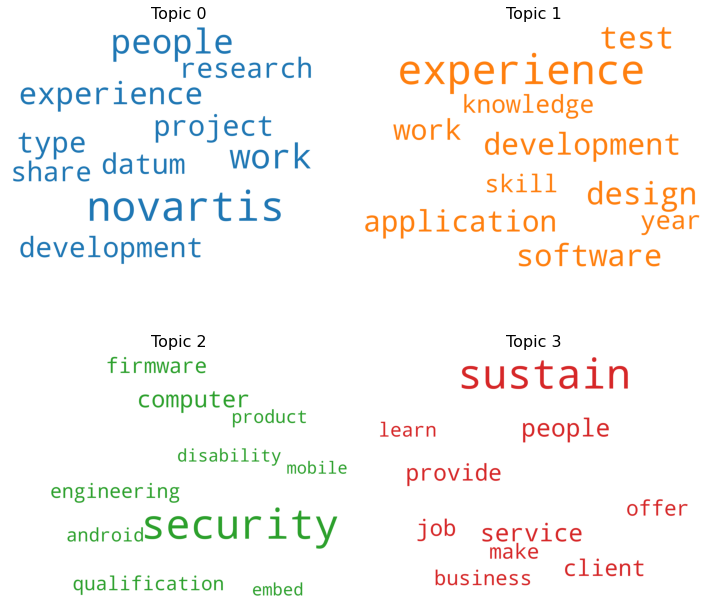

In [15]:
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stopwords,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)
topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()
cloud.to_file('N.png')

In [16]:
#This is used as the input by the LDA model.

#If you want to see what word a given id corresponds to, pass the id as a key to the dictionary.
id2word[0]
# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('accuracy', 1),
  ('algorithm', 1),
  ('area', 2),
  ('benefit', 1),
  ('build', 1),
  ('building', 1),
  ('character', 2),
  ('communication', 1),
  ('computer', 6),
  ('covid', 1),
  ('datum', 2),
  ('deep', 3),
  ('degree', 2),
  ('develop', 2),
  ('different', 1),
  ('due', 1),
  ('electrical', 1),
  ('engineer', 1),
  ('engineering', 3),
  ('enjoy', 1),
  ('environment', 1),
  ('evaluate', 1),
  ('experience', 6),
  ('experiment', 1),
  ('following', 1),
  ('full', 1),
  ('health', 1),
  ('high', 1),
  ('image', 2),
  ('image_processing', 1),
  ('insurance', 1),
  ('job', 1),
  ('learn', 1),
  ('learning', 3),
  ('leverage', 1),
  ('machine', 1),
  ('machine_learning', 1),
  ('maintainability', 1),
  ('master', 1),
  ('min', 1),
  ('model', 4),
  ('must', 1),
  ('number', 1),
  ('object', 2),
  ('optical', 2),
  ('performance', 1),
  ('pipeline', 1),
  ('problem', 1),
  ('problem_solve', 1),
  ('processing', 1),
  ('project', 3),
  ('python', 1),
  ('qualification', 1),
  ('rec

In [17]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -6.470674981785661

Coherence Score:  0.3526319284870154


In [18]:
# Now that the LDA model is built, the next step is to examine the produced topics and the associated keywords.
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()

# feed the LDA model into the pyLDAvis instance
lda_viz = gensimvis.prepare(lda_model, corpus, id2word)
lda_viz


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
8     -0.217234  0.171754       1        1  21.379084
7     -0.006311 -0.066241       2        1  20.517011
5     -0.052641  0.036753       3        1  16.251839
1     -0.077001  0.105442       4        1  13.116403
4     -0.204053 -0.292706       5        1   9.721376
6     -0.090711  0.123921       6        1   8.182609
0      0.026998 -0.029822       7        1   5.391363
3      0.154462 -0.084178       8        1   2.881034
9      0.166334 -0.012994       9        1   1.725990
2      0.300157  0.048071      10        1   0.833289, topic_info=            Term         Freq        Total Category  logprob  loglift
10         datum  7190.000000  7190.000000  Default  30.0000  30.0000
2111     pricing  1458.000000  1458.000000  Default  29.0000  29.0000
107     business  4116.000000  4116.000000  Default  28.0000  28.0000
353         team  6224.000000  6224.000000  Default  27.0000  27.0000
22    experience  8144.000000  8144.000000  Default  26.0000  26.0000
...          ...          ...          ...      ...      ...      ...
248         make    16.657305   779.355693  Topic10  -5.2150   0.9419
701      utilize    14.816454   371.998438  Topic10  -5.3321   1.5644
383        world    14.305235   549.908386  Topic10  -5.3673   1.1384
214      include    13.995975  1532.997257  Topic10  -5.3891   0.0913
1075       prove    13.465354   331.291020  Topic10  -5.4278   1.5847

[710 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
385       2  0.237495  ability
385       3  0.188017  ability
385       4  0.039216  ability
385       5  0.490749  ability
385       6  0.032252  ability
...     ...       ...      ...
75        7  0.032763     year
75        8  0.007084     year
75        9  0.010921     year
3429      2  0.379895    yield
3429     10  0.596978    yield

[1451 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[9, 8, 6, 2, 5, 7, 1, 4, 10, 3])

Each bubble on the left-hand side plot represents a topic. The larger the bubble, the more prevalent is that topic.

A good topic model will have fairly big, non-overlapping bubbles scattered throughout the chart instead of being clustered in one quadrant.

A model with too many topics, will typically have many overlaps, small sized bubbles clustered in one region of the chart.

If you move the cursor over one of the bubbles, the words and bars on the right-hand side will update. These words are the salient keywords that form the selected topic.

In [19]:
#So far we have seen Gensim’s inbuilt version of the LDA algorithm. 
# Mallet’s version, however, often gives a better quality of topics.

# Gensim provides a wrapper to implement Mallet’s LDA from within Gensim itself. 
# You only need to download the zipfile, unzip it and provide the path to mallet in the unzipped directory to gensim.models.wrappers.LdaMallet.

# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
import os
os.environ.update({'MALLET_HOME': r'DC_Assignment/mallet-2.0.6/resume_dataset'})
os.environ.update({'MALLET_PATH': r'DC_Assignment/mallet-2.0.6/bin/mallet'})
mallet_path = 'DC_Assignment/mallet-2.0.6/bin/mallet' # update this path
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=20, id2word=id2word)

In [20]:
# Show Topics
pprint(ldamallet.show_topics(formatted=False))

# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)

[(3,
  [('software', 0.05193935334591731),
   ('system', 0.044449856907994884),
   ('engineer', 0.03781282347926688),
   ('design', 0.030445107471229374),
   ('experience', 0.0281921695183584),
   ('scale', 0.021737806734457774),
   ('build', 0.018267064482737624),
   ('strong', 0.018206174267795167),
   ('engineering', 0.017597272118370578),
   ('team', 0.017171040613773367)]),
 (18,
  [('ability', 0.05657937277723893),
   ('work', 0.055350792111218884),
   ('skill', 0.0451988360814743),
   ('team', 0.041383769802780475),
   ('project', 0.029485935984481085),
   ('communication', 0.02825735531846104),
   ('strong', 0.027740058195926284),
   ('product', 0.02547688328483673),
   ('development', 0.021403168444875526),
   ('excellent', 0.019527966375687034)]),
 (12,
  [('system', 0.03977605624633813),
   ('service', 0.03398216261962112),
   ('security', 0.029294967775535447),
   ('network', 0.0202460777293145),
   ('database', 0.019269578803463316),
   ('cloud', 0.018944079161512924),
   

In [21]:
#We will find the optimal number of topics by building many LDA models with different 
#values of number of topics (k) and pick the one that gives the highest coherence value.

#Choosing a ‘k’ that marks the end of a rapid growth of topic coherence usually offers 
#meaningful and interpretable topics. Picking an even higher value can sometimes provide more granular sub-topics.

#If you see the same keywords being repeated in multiple topics, it’s probably a sign that the ‘k’ is too large.

#The compute_coherence_values() below trains multiple LDA models and provides the models and their corresponding coherence scores.

def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [22]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=2, limit=40, step=6)

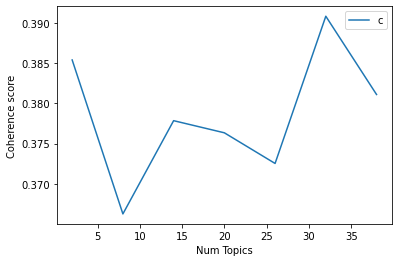

In [23]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [24]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.3854
Num Topics = 8  has Coherence Value of 0.3663
Num Topics = 14  has Coherence Value of 0.3779
Num Topics = 20  has Coherence Value of 0.3763
Num Topics = 26  has Coherence Value of 0.3725
Num Topics = 32  has Coherence Value of 0.3908
Num Topics = 38  has Coherence Value of 0.3811


In [25]:
# Select the model and print the topics
# If the coherence score seems to keep increasing, it may make better sense to pick the model
# that gave the highest CV before flattening out. This is exactly the case here.

# So for further steps I will choose the model with 32 topics itself.

optimal_model = model_list[5]
model_topics = optimal_model.show_topics(formatted=False)
pprint(optimal_model.print_topics(num_words=10))

[(25,
  '0.158*"datum" + 0.079*"experience" + 0.063*"analytic" + 0.050*"data" + '
  '0.047*"knowledge" + 0.046*"tool" + 0.046*"year" + 0.039*"develop" + '
  '0.034*"industry" + 0.032*"quality"'),
 (10,
  '0.036*"support" + 0.030*"client" + 0.027*"service" + 0.024*"company" + '
  '0.023*"work" + 0.018*"application" + 0.017*"enterprise" + '
  '0.017*"environment" + 0.017*"management" + 0.016*"global"'),
 (30,
  '0.044*"job" + 0.040*"work" + 0.036*"year" + 0.033*"experience" + '
  '0.032*"prefer" + 0.029*"candidate" + 0.024*"time" + 0.018*"company" + '
  '0.016*"technology" + 0.015*"type"'),
 (13,
  '0.072*"ability" + 0.068*"work" + 0.053*"experience" + 0.047*"team" + '
  '0.023*"environment" + 0.023*"development" + 0.019*"software" + '
  '0.018*"demonstrate" + 0.017*"multiple" + 0.014*"technical"'),
 (1,
  '0.024*"information" + 0.018*"disability" + 0.015*"provide" + '
  '0.015*"opportunity" + 0.015*"status" + 0.013*"include" + 0.013*"employment" '
  '+ 0.013*"equal" + 0.012*"world" + 0.

In [26]:
# Finding the dominant topic in each document
# To find that, we find the topic number that has the highest percentage contribution in that document.
def format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=data)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,27.0,0.2068,"business, analytic, analysis, model, stakehold...",Data Scientist thoughtgreen technologies pvt l...
1,1,5.0,0.6141,"people, client, provide, business, offer, serv...",Referral Data Engineering Deloitte SCAM ALERT...
2,2,9.0,0.0991,"experience, application, design, developer, de...",Software Developer Fresher Only Supremejobso...
3,3,21.0,0.0927,"technology, solution, work, salesforce, team, ...",Data Integration ETL Developer ServiceNow De...
4,4,11.0,0.3624,"security, product, work, engineering, skill, t...",Data Science Intern Microsoft Microsoft India ...
5,5,27.0,0.2367,"business, analytic, analysis, model, stakehold...",Junior Data Scientist Soothsayer Analytics JOB...
6,6,8.0,0.1533,"project, management, business, manage, program...",Strategic Analyst Quantitative Strate...
7,7,12.0,0.3273,"research, work, write, skill, company, validat...",Protein scientist BIOGENEX LIFE SCIENCES PVT L...
8,8,12.0,0.4962,"research, work, write, skill, company, validat...",Molecular Biologist BIOGENEX LIFE SCIENCES PVT...
9,9,4.0,0.5831,"process, project, team, provide, requirement, ...",Sr. Associate Cognizant Technical Lead\nQualif...


In [27]:
#Find the most representative document for each topic
# Group top 5 sentences under each topic
sent_topics_sorteddf_mallet = pd.DataFrame()

sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

# Show
sent_topics_sorteddf_mallet.head()

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
0,0.0,0.4409,"datum, data, experience, big, work, model, bui...",ETL Lead ProKarma India Overview \nExperience ...
1,1.0,0.5657,"information, disability, provide, opportunity,...",R D Engineer PepsiCo Auto req ID BR\nJo...
2,2.0,0.6363,"test, testing, development, software, automati...",Test Architect Oracle Test Architect MPL\...
3,3.0,0.5085,"product, team, software, development, knowledg...",Lead Software Engineer The Straits Network Lyn...
4,4.0,0.6428,"process, project, team, provide, requirement, ...",Manager Projects Cognizant Project Manager\n...


In [28]:
#Topic distribution across documents

# Number of Documents for Each Topic
topic_counts = df_topic_sents_keywords['Dominant_Topic'].value_counts()

# Percentage of Documents for Each Topic
topic_contribution = round(topic_counts/topic_counts.sum(), 4)

# Topic Number and Keywords
topic_num_keywords = df_topic_sents_keywords[['Dominant_Topic', 'Topic_Keywords']]

# Concatenate Column wise
df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis=1)

# Change Column names
df_dominant_topics.columns = ['Dominant_Topic', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

# Show
df_dominant_topics

,Dominant_Topic,Topic_Keywords,Num_Documents,Perc_Documents
0.0,27.0,"business, analytic, analysis, model, stakehold...",35.0,0.0233
1.0,5.0,"people, client, provide, business, offer, serv...",41.0,0.0273
2.0,9.0,"experience, application, design, developer, de...",47.0,0.0313
3.0,21.0,"technology, solution, work, salesforce, team, ...",36.0,0.0240
4.0,11.0,"security, product, work, engineering, skill, t...",21.0,0.0140
...,...,...,...,...
1495.0,14.0,"team, pricing, business, analysis, ability, da...",NaN,NaN
1496.0,20.0,"datum, data, engineer, product, visualization,...",NaN,NaN
1497.0,14.0,"team, pricing, business, analysis, ability, da...",NaN,NaN
1498.0,20.0,"datum, data, engineer, product, visualization,...",NaN,NaN


In [29]:
jobs = pd.read_pickle('./jobs_cleaned.pkl')

In [30]:
jobs

,JobTitle,Company,Description,jobid,finaldesc,text
0,Data Scientist,thoughtgreen technologies pvt ltd,The role of a DATA SCIENTIST / Computer Vision...,1,Data Scientist thoughtgreen technologies pvt l...,data scientist thoughtgreen technology pvt ltd...
1,Referral- Data Engineering,Deloitte,SCAM ALERT: Caution against fraudulent job off...,2,Referral Data Engineering Deloitte SCAM ALERT...,referral data engineering deloitte scam alert ...
2,Software Developer (Fresher Only),Supremejobsolution,"A Java, C#, .Net, C, Sybase and Oracle Softwar...",3,Software Developer Fresher Only Supremejobso...,software developer fresher supremejobsolution ...
3,Data Integration / ETL Developer,ServiceNow,Description:\nServiceNow is changing the way p...,4,Data Integration ETL Developer ServiceNow De...,data integration etl developer servicenow desc...
4,Data Science Intern,Microsoft,"Microsoft India (R&D) Private Limited, a subsi...",5,Data Science Intern Microsoft Microsoft India ...,data science intern microsoft microsoft india ...
...,...,...,...,...,...,...
1495,Senior Analyst - Pricing | Thesis Company | 5-...,Talent500,Role Objective:\nThe Sr. Pricing Analyst – Adv...,1496,Senior Analyst Pricing Thesis Company ...,senior analyst pricing thesis company year tal...
1496,Big Data Developer | Applicable Assortment | 1...,Talent500,Associate Data Engineer Position\nOrganization...,1497,Big Data Developer Applicable Assortment ...,big data developer applicable assortment year ...
1497,Senior Analyst - Pricing (Python OR R) | Steal...,Talent500,Role Objective:\nThe Sr. Pricing Analyst – Adv...,1498,Senior Analyst Pricing Python OR R Steal...,senior analyst pricing python r stealth mode s...
1498,Big Data Developer | X Marks The Spot | 1-3 Years,Talent500,Associate Data Engineer Position\nOrganization...,1499,Big Data Developer X Marks The Spot Ye...,big data developer x mark spot year talent ass...


# 4) Data Pre-Processing: Resume Dataset

In [31]:
import pandas as pd

resume_dataset = pd.read_csv('UpdatedResumeDataSet.csv' ,encoding='utf-8') 
resume_dataset['resumeid']=resume_dataset.index+1

In [32]:
resume_dataset.head()

,Category,Resume,resumeid
0,Data Science,Skills * Programming Languages: Python (pandas...,1
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...,2
2,Data Science,"Areas of Interest Deep Learning, Control Syste...",3
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...,4
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab...",5


In [33]:
resume_dataset.describe()

,resumeid
count,962.00000
mean,481.50000
std,277.84978
min,1.00000
25%,241.25000
50%,481.50000
75%,721.75000
max,962.00000


In [34]:
print ("Displaying the distinct categories of resume:\n\n ")
print (resume_dataset['Category'].unique())

Displaying the distinct categories of resume:

 
['Data Science' 'HR' 'Advocate' 'Arts' 'Web Designing'
 'Mechanical Engineer' 'Sales' 'Health and fitness' 'Civil Engineer'
 'Java Developer' 'Business Analyst' 'SAP Developer' 'Automation Testing'
 'Electrical Engineering' 'Operations Manager' 'Python Developer'
 'DevOps Engineer' 'Network Security Engineer' 'PMO' 'Database' 'Hadoop'
 'ETL Developer' 'DotNet Developer' 'Blockchain' 'Testing']


In [35]:
# To identify the number of records in each category

print ("Displaying the distinct categories of resume and the number of datapoints in each category:\n\n")
print (resume_dataset['Category'].value_counts())

Displaying the distinct categories of resume and the number of datapoints in each category:


Java Developer               84
Testing                      70
DevOps Engineer              55
Python Developer             48
Web Designing                45
HR                           44
Hadoop                       42
Data Science                 40
Operations Manager           40
ETL Developer                40
Mechanical Engineer          40
Blockchain                   40
Sales                        40
Arts                         36
Database                     33
PMO                          30
Electrical Engineering       30
Health and fitness           30
DotNet Developer             28
Business Analyst             28
Automation Testing           26
Network Security Engineer    25
SAP Developer                24
Civil Engineer               24
Advocate                     20
Name: Category, dtype: int64


In [36]:
import re
import string
import nltk
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')

def clean_text(text):
    #convert text to lowercase
    text = text.lower() 
    #remove any numeric characters
    text = ''.join([word for word in text if not word.isdigit()]) 
    # remove URLs
    text = re.sub('http\S+\s*', ' ', text)  
    # remove RT and cc
    text = re.sub('RT|cc', ' ', text)
    # remove hashtags
    text = re.sub('#\S+', '', text)  
    # remove mentions
    text = re.sub('@\S+', '  ', text)  
    #punctuations removal
    text = "".join([word for word in text if word not in string.punctuation])
    text = re.sub("\W", " ", str(text))
    #stopwords removal
    ext = [word for word in text.split() if word not in stopwords]
    #replace consecutive non-ASCII characters with a space
    text = re.sub(r'[^\x00-\x7f]',r' ', text) 
    #extra whitespace removal
    text = re.sub('\s+', ' ', text)
    return text

resume_dataset['Cleaned_Resume'] = resume_dataset['Resume'].apply(lambda x: clean_text(x))

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/nitinjethwani/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [37]:
resume_dataset

,Category,Resume,resumeid,Cleaned_Resume
0,Data Science,Skills * Programming Languages: Python (pandas...,1,skills programming languages python pandas num...
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...,2,education details may to may be uitrgpv data s...
2,Data Science,"Areas of Interest Deep Learning, Control Syste...",3,areas of interest deep learning control system...
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...,4,skills r python sap hana tableau sap hana sql ...
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab...",5,education details mca ymcaust faridabad haryan...
...,...,...,...,...
957,Testing,Computer Skills: â¢ Proficient in MS office (...,958,computer skills proficient in ms office word b...
958,Testing,â Willingness to accept the challenges. â ...,959,willingness to a ept the challenges positive ...
959,Testing,"PERSONAL SKILLS â¢ Quick learner, â¢ Eagerne...",960,personal skills quick learner eagerness to lea...
960,Testing,COMPUTER SKILLS & SOFTWARE KNOWLEDGE MS-Power ...,961,computer skills software knowledge mspower poi...


In [38]:
final_resumes = resume_dataset[['Category','Cleaned_Resume','resumeid']]
final_resumes['text'] = final_resumes['Category'] + ' ' + final_resumes['Cleaned_Resume']
final_resumes

,Category,Cleaned_Resume,resumeid,text
0,Data Science,skills programming languages python pandas num...,1,Data Science skills programming languages pyth...
1,Data Science,education details may to may be uitrgpv data s...,2,Data Science education details may to may be u...
2,Data Science,areas of interest deep learning control system...,3,Data Science areas of interest deep learning c...
3,Data Science,skills r python sap hana tableau sap hana sql ...,4,Data Science skills r python sap hana tableau ...
4,Data Science,education details mca ymcaust faridabad haryan...,5,Data Science education details mca ymcaust far...
...,...,...,...,...
957,Testing,computer skills proficient in ms office word b...,958,Testing computer skills proficient in ms offic...
958,Testing,willingness to a ept the challenges positive ...,959,Testing willingness to a ept the challenges p...
959,Testing,personal skills quick learner eagerness to lea...,960,Testing personal skills quick learner eagernes...
960,Testing,computer skills software knowledge mspower poi...,961,Testing computer skills software knowledge msp...


In [39]:
from sklearn.preprocessing import LabelEncoder

labelencoder = LabelEncoder()
resume_dataset["Category_Num"] = labelencoder.fit_transform(resume_dataset["Category"])
# print(type(labels))

resume_dataset.head()
#resume_dataset.tail()
resume_dataset

,Category,Resume,resumeid,Cleaned_Resume,Category_Num
0,Data Science,Skills * Programming Languages: Python (pandas...,1,skills programming languages python pandas num...,6
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...,2,education details may to may be uitrgpv data s...,6
2,Data Science,"Areas of Interest Deep Learning, Control Syste...",3,areas of interest deep learning control system...,6
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...,4,skills r python sap hana tableau sap hana sql ...,6
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab...",5,education details mca ymcaust faridabad haryan...,6
...,...,...,...,...,...
957,Testing,Computer Skills: â¢ Proficient in MS office (...,958,computer skills proficient in ms office word b...,23
958,Testing,â Willingness to accept the challenges. â ...,959,willingness to a ept the challenges positive ...,23
959,Testing,"PERSONAL SKILLS â¢ Quick learner, â¢ Eagerne...",960,personal skills quick learner eagerness to lea...,23
960,Testing,COMPUTER SKILLS & SOFTWARE KNOWLEDGE MS-Power ...,961,computer skills software knowledge mspower poi...,23


In [40]:
resume_dataset["Category_Num"].unique()

array([ 6, 12,  0,  1, 24, 16, 22, 14,  5, 15,  4, 21,  2, 11, 18, 20,  8,
       17, 19,  7, 13, 10,  9,  3, 23])

In [41]:
final_resumes = resume_dataset[['Category','Cleaned_Resume','resumeid']]
final_resumes['text'] = final_resumes['Category'] + ' ' + final_resumes['Cleaned_Resume']
final_resumes

<ipython-input-41-21bc082e8a25>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_resumes['text'] = final_resumes['Category'] + ' ' + final_resumes['Cleaned_Resume']


,Category,Cleaned_Resume,resumeid,text
0,Data Science,skills programming languages python pandas num...,1,Data Science skills programming languages pyth...
1,Data Science,education details may to may be uitrgpv data s...,2,Data Science education details may to may be u...
2,Data Science,areas of interest deep learning control system...,3,Data Science areas of interest deep learning c...
3,Data Science,skills r python sap hana tableau sap hana sql ...,4,Data Science skills r python sap hana tableau ...
4,Data Science,education details mca ymcaust faridabad haryan...,5,Data Science education details mca ymcaust far...
...,...,...,...,...
957,Testing,computer skills proficient in ms office word b...,958,Testing computer skills proficient in ms offic...
958,Testing,willingness to a ept the challenges positive ...,959,Testing willingness to a ept the challenges p...
959,Testing,personal skills quick learner eagerness to lea...,960,Testing personal skills quick learner eagernes...
960,Testing,computer skills software knowledge mspower poi...,961,Testing computer skills software knowledge msp...


In [42]:
import nltk
from nltk.corpus import stopwords
stopwords = stopwords.words('english')
final_resumes["text"]      

data1 = final_resumes.text.values.tolist()
def sent_to_words(sentences1):
    for sentence in sentences1:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words_resume = list(sent_to_words(data))
data_words_resume

[['data',
  'scientist',
  'thoughtgreen',
  'technologies',
  'pvt',
  'ltd',
  'the',
  'role',
  'of',
  'data',
  'scientist',
  'computer',
  'vision',
  'engineer',
  'would',
  'require',
  'the',
  'following',
  'skills',
  'to',
  'build',
  'models',
  'using',
  'different',
  'image',
  'processing',
  'techniques',
  'to',
  'work',
  'on',
  'number',
  'of',
  'computer',
  'vision',
  'projects',
  'in',
  'the',
  'area',
  'of',
  'image',
  'segmentation',
  'optical',
  'character',
  'recognition',
  'object',
  'recognition',
  'and',
  'deep',
  'learning',
  'run',
  'experiments',
  'using',
  'computer',
  'vision',
  'algorithms',
  'and',
  'models',
  'to',
  'evaluate',
  'their',
  'performance',
  'with',
  'regards',
  'to',
  'accuracy',
  'processing',
  'time',
  'and',
  'maintainability',
  'develop',
  'image',
  'processing',
  'pipelines',
  'that',
  'leverage',
  'variety',
  'of',
  'data',
  'engineering',
  'techniques',
  'and',
  'machin

In [43]:
#Build the bigram and trigram models

# Build the bigram and trigram models

bigram_resume = gensim.models.Phrases(data_words_resume, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram_resume = gensim.models.Phrases(bigram_resume[data_words_resume], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod_resume = gensim.models.phrases.Phraser(bigram_resume)
trigram_mod_resume = gensim.models.phrases.Phraser(trigram_resume)

#See bigram and trigram example
print(bigram_mod_resume[data_words_resume[0]])
print(trigram_mod_resume[bigram_mod_resume[data_words_resume[0]]])

['data', 'scientist', 'thoughtgreen', 'technologies', 'pvt_ltd', 'the', 'role', 'of', 'data', 'scientist', 'computer', 'vision', 'engineer', 'would', 'require', 'the', 'following', 'skills', 'to', 'build', 'models', 'using', 'different', 'image_processing', 'techniques', 'to', 'work', 'on', 'number', 'of', 'computer', 'vision', 'projects', 'in', 'the', 'area', 'of', 'image', 'segmentation', 'optical', 'character', 'recognition', 'object', 'recognition', 'and', 'deep', 'learning', 'run', 'experiments', 'using', 'computer', 'vision', 'algorithms', 'and', 'models', 'to', 'evaluate', 'their', 'performance', 'with', 'regards', 'to', 'accuracy', 'processing', 'time', 'and', 'maintainability', 'develop', 'image_processing', 'pipelines', 'that', 'leverage', 'variety', 'of', 'data', 'engineering', 'techniques', 'and', 'machine', 'learned', 'models', 'to', 'solve', 'problems', 'required', 'experience', 'skills', 'and', 'qualifications', 'enjoys', 'problem_solving', 'in', 'an', 'environment', 'th

In [44]:
# Remove Stopwords, Make Bigrams and Lemmatize
def remove_stopwords_resume(texts_resume):
    return [[word for word in simple_preprocess(str(doc)) if word not in stopwords] for doc in texts_resume]

def make_bigrams_resume(texts_resume):
    return [bigram_mod_resume[doc] for doc in texts_resume]

def make_trigrams_resume(texts_resume):
    return [trigram_mod_resume[bigram_mod_resume[doc]] for doc in texts_resume]

def lemmatization1(texts_resume, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    texts_out_resume = []
    for sent in texts:
        #nlp is defined below as the spacy model for basic NLP
        doc_resume = nlp(" ".join(sent)) 
        texts_out_resume.append([token.lemma_ for token in doc1 if token.pos_ in allowed_postags])
    return texts_out_resume

In [45]:
#Remove Stop Words
data_words_nostops_resume = remove_stopwords_resume(data_words_resume)

# Form Bigrams
data_words_bigrams_resume = make_bigrams_resume(data_words_nostops_resume)

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# python3 -m spacy download en
# This is needed for lemmatization
nlp_resume = spacy.load("en_core_web_sm", disable=['parser', 'ner'])

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized_resume = lemmatization(data_words_bigrams_resume, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized_resume[:1])

[['scientist', 'computer', 'vision', 'engineer', 'would', 'require', 'following', 'skill', 'build', 'model', 'use', 'different', 'image_processing', 'technique', 'work', 'number', 'computer', 'vision', 'project', 'area', 'image', 'segmentation', 'optical', 'character', 'recognition', 'object', 'recognition', 'deep', 'learning', 'run', 'experiment', 'use', 'computer', 'vision', 'algorithm', 'model', 'evaluate', 'performance', 'regard', 'accuracy', 'processing', 'time', 'maintainability', 'develop', 'pipeline', 'leverage', 'variety', 'datum', 'engineering', 'technique', 'machine', 'learn', 'model', 'solve', 'problem', 'require', 'experience', 'skill', 'qualification', 'enjoy', 'problem_solve', 'environment', 'high', 'degree', 'uncertainty', 'must', 'work', 'computer', 'vision', 'project', 'area', 'image', 'segmentation', 'optical', 'character', 'recognition', 'object', 'recognition', 'deep', 'learning', 'machine_learning', 'experience', 'develop', 'software', 'python', 'experience', 'com

In [46]:
# Create Dictionary
id2word1 = corpora.Dictionary(data_lemmatized_resume)

# Create Corpus
texts1 = data_lemmatized_resume

# Term Document Frequency
corpus1 = [id2word1.doc2bow(text) for text in texts1]

# View
print(corpus1[:1])
#Gensim creates a unique id for each word in the document. 
#The produced corpus shown below is a mapping of (word_id, word_frequency).

[[(0, 1), (1, 1), (2, 2), (3, 1), (4, 1), (5, 1), (6, 2), (7, 1), (8, 6), (9, 1), (10, 2), (11, 3), (12, 2), (13, 2), (14, 1), (15, 1), (16, 1), (17, 1), (18, 3), (19, 1), (20, 1), (21, 1), (22, 6), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 2), (29, 1), (30, 1), (31, 1), (32, 1), (33, 3), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 4), (41, 1), (42, 1), (43, 2), (44, 2), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1), (50, 3), (51, 1), (52, 1), (53, 4), (54, 1), (55, 1), (56, 5), (57, 1), (58, 2), (59, 1), (60, 2), (61, 1), (62, 3), (63, 1), (64, 1), (65, 1), (66, 2), (67, 2), (68, 1), (69, 1), (70, 2), (71, 1), (72, 5), (73, 3), (74, 1), (75, 4)]]


In [47]:
#This is used as the input by the LDA model.

#If you want to see what word a given id corresponds to, pass the id as a key to the dictionary.
id2word1[0]
# Human readable format of corpus (term-frequency)
[[(id2word1[id], freq) for id, freq in cp] for cp in corpus1[:1]]

[[('accuracy', 1),
  ('algorithm', 1),
  ('area', 2),
  ('benefit', 1),
  ('build', 1),
  ('building', 1),
  ('character', 2),
  ('communication', 1),
  ('computer', 6),
  ('covid', 1),
  ('datum', 2),
  ('deep', 3),
  ('degree', 2),
  ('develop', 2),
  ('different', 1),
  ('due', 1),
  ('electrical', 1),
  ('engineer', 1),
  ('engineering', 3),
  ('enjoy', 1),
  ('environment', 1),
  ('evaluate', 1),
  ('experience', 6),
  ('experiment', 1),
  ('following', 1),
  ('full', 1),
  ('health', 1),
  ('high', 1),
  ('image', 2),
  ('image_processing', 1),
  ('insurance', 1),
  ('job', 1),
  ('learn', 1),
  ('learning', 3),
  ('leverage', 1),
  ('machine', 1),
  ('machine_learning', 1),
  ('maintainability', 1),
  ('master', 1),
  ('min', 1),
  ('model', 4),
  ('must', 1),
  ('number', 1),
  ('object', 2),
  ('optical', 2),
  ('performance', 1),
  ('pipeline', 1),
  ('problem', 1),
  ('problem_solve', 1),
  ('processing', 1),
  ('project', 3),
  ('python', 1),
  ('qualification', 1),
  ('rec

# 5) Topic Modelling : Resume Dataset

In [48]:
# Build LDA model
# alpha and eta are hyperparameters that affect sparsity of the topics.
# According to the Gensim docs, both defaults to 1.0/num_topics prior
# chunksize is the number of documents to be used in each training chunk. 
# update_every determines how often the model parameters should be updated and 
# passes is the total number of training passes.
lda_model1 = gensim.models.ldamodel.LdaModel(corpus=corpus1,
                                           id2word=id2word1,
                                           num_topics=9, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=20,
                                           alpha='auto',
                                           per_word_topics=True)

In [49]:
pprint(lda_model1.print_topics(num_words=20))
doc_lda1 = lda_model1[corpus1]

[(0,
  '0.028*"novartis" + 0.021*"people" + 0.012*"work" + 0.012*"experience" + '
  '0.011*"share" + 0.011*"type" + 0.011*"datum" + 0.010*"global" + '
  '0.010*"empower" + 0.009*"functional" + 0.008*"regulatory" + 0.008*"full" + '
  '0.008*"patient" + 0.008*"development" + 0.007*"network" + 0.007*"role" + '
  '0.007*"opportunity" + 0.007*"company" + 0.007*"statistical" + 0.007*"join"'),
 (1,
  '0.042*"experience" + 0.023*"design" + 0.021*"software" + 0.020*"test" + '
  '0.019*"development" + 0.018*"application" + 0.018*"work" + 0.014*"year" + '
  '0.013*"system" + 0.012*"knowledge" + 0.012*"skill" + 0.011*"job" + '
  '0.010*"develop" + 0.010*"testing" + 0.010*"developer" + 0.009*"code" + '
  '0.009*"use" + 0.009*"computer" + 0.009*"integration" + 0.008*"service"'),
 (2,
  '0.026*"research" + 0.011*"game" + 0.010*"scientific" + 0.010*"researcher" + '
  '0.010*"product" + 0.009*"qualification" + 0.009*"skill" + 0.009*"sandoz" + '
  '0.008*"work" + 0.007*"medical" + 0.007*"manufacture" + 

In [50]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD, NMF, LatentDirichletAllocation
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.metrics import pairwise_distances
from sklearn.cluster import KMeans, DBSCAN
tfidf1 = TfidfVectorizer(ngram_range=(2,3), 
                        stop_words='english', 
                        sublinear_tf=True,
                        min_df=12, 
                        max_df=0.7)
doc_word1 = tfidf1.fit_transform(final_resumes['text'])
doc_word1.shape

(962, 4806)

In [51]:
component_count1 = 8
component_names1 = [f'Topic {component_num+1}' for component_num in range(component_count1)]

In [52]:
lda2 = LatentDirichletAllocation(n_components=component_count1, # Number of topics
                                learning_method = 'online',
                                random_state=0,       
                                n_jobs = -1)  # Use all available CPUs

doc_topic1 = lda2.fit_transform(doc_word1)

topic_word = pd.DataFrame(lda2.components_.round(3),
                          index = component_names1,
                          columns = tfidf1.get_feature_names())

resume_doc_topic_lda2= pd.DataFrame(doc_topic1.round(5), 
                                    index=final_resumes['text'], 
                                    columns = component_names1)

In [53]:
def display_topics(model, feature_names, no_top_words, topic_names=None):
    for ix, topic in enumerate(model.components_):
        if not topic_names or not topic_names[ix]:
            print("\nTopic ", ix+1)
        else:
            print("\nTopic: '",topic_names[ix],"'")
        print(", ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))

In [54]:
display_topics(lda2, tfidf1.get_feature_names(), 10)


Topic  1
electrical engineering, engineering skill, engineering skill details, electrical engineering skill, power plant, electrical engineering education, engineering education, engineering education details, madhya pradesh, project execution

Topic  2
exprience year, exprience year months, year months, etl developer, year monthscompany, year monthscompany details, exprience year monthscompany, data science, electronics telecommunication, machine learning

Topic  3
chennai tamil nadu, chennai tamil, tamil nadu, hr education, hr education details, java developer, description hr, hr skill, hr skill details, education details june

Topic  4
ms sql server, ms sql, sql server exprience, server exprience, technologies pvt, devops engineer, server exprience months, channel partners, sales manager, site visit

Topic  5
html css, exprience year, exprience year months, year months, exprience months, hr skill details, hr skill, net developer, dot net developer, javascript jquery

Topic  6
roles

# 6) Model Building & Evaluation

Taking Sample JD and Sample resume as input for Evualation Purposes.

In [55]:
# Cleaning the text in the "Resume" column. 
# Following standard data preprocessing steps as below.


import re
import string
import nltk
from string import punctuation
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')
my_punctuation = punctuation.replace(".", "")

def clean_text(text):
    #convert text to lowercase
    text = text.lower() 
    #remove any numeric characters
    text = ''.join([word for word in text if not word.isdigit()]) 
    # remove URLs
    text = re.sub('http\S+\s*', ' ', text) 
    # remove RT and cc
    text = re.sub('RT|cc', ' ', text)
    # remove hashtags
    text = re.sub('#\S+', '', text)  
    # remove mentions
    text = re.sub('@\S+', '  ', text)  
    #punctuations removal
    text = "".join([word for word in text if word not in my_punctuation])
    #text = re.sub("\W", " ", str(text))
    #replace consecutive non-ASCII characters with a space
    text = re.sub(r'[^\x00-\x7f]',r' ', text) 
    #extra whitespace removal
    text = re.sub('\s+', ' ', text)
    #stopwords removal
    text = " ".join([word for word in text.split() if word not in stopwords])
    return text



[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/nitinjethwani/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [56]:
final_jobs['Cleaned_JobDescription'] = final_jobs['finaldesc'].apply(lambda x: clean_text(x))
final_jobs.Cleaned_JobDescription[0]

'data scientist thoughtgreen technologies pvt ltd role data scientist computer vision engineer would require following skills build models using different image processing techniques work number computer vision projects area image segmentation optical character recognition object recognition deep learning. run experiments using computer vision algorithms models evaluate performance regards uracy processing time maintainability. develop image processing pipelines leverage variety data engineering techniques machine learned models solve problems. required experience skills qualifications enjoys problem solving environment high degree uncertainty must worked computer vision projects area image segmentation optical character recognition object recognition deep learning machine learning. experience developing software python. experience machine learning computer vision project strong communication skills masters phd software engineering computer science electrical engineering similar degree

In [57]:
resume_dataset['Cleaned_Resume'] = resume_dataset['Resume'].apply(lambda x: clean_text(x))
resume_dataset.Cleaned_Resume[0]

'skills programming languages python pandas numpy scipy scikitlearn matplotlib sql java javascriptjquery. machine learning regression svm na bayes knn random forest decision trees boosting techniques cluster analysis word embedding sentiment analysis natural language processing dimensionality reduction topic modelling lda nmf pca neural nets. database visualizations mysql sqlserver cassandra hbase elasticsearch d.js dc.js plotly kibana matplotlib ggplot tableau. others regular expression html css angular logstash kafka python flask git docker computer vision open cv understanding deep learning.education details data science assurance associate data science assurance associate ernst young llp skill details javascript exprience months jquery exprience months python exprience monthscompany details company ernst young llp description fraud investigations dispute services assurance technology assisted review tar technology assisted review assists elerating review process run analytics gener

In [58]:
sample_JobDesc = final_jobs.Cleaned_JobDescription[0]
sample_JobDesc
#type(sample_JobDesc)

'data scientist thoughtgreen technologies pvt ltd role data scientist computer vision engineer would require following skills build models using different image processing techniques work number computer vision projects area image segmentation optical character recognition object recognition deep learning. run experiments using computer vision algorithms models evaluate performance regards uracy processing time maintainability. develop image processing pipelines leverage variety data engineering techniques machine learned models solve problems. required experience skills qualifications enjoys problem solving environment high degree uncertainty must worked computer vision projects area image segmentation optical character recognition object recognition deep learning machine learning. experience developing software python. experience machine learning computer vision project strong communication skills masters phd software engineering computer science electrical engineering similar degree

In [59]:
sample_resume = resume_dataset.Cleaned_Resume[0]
sample_resume
#type(sample_resume)

'skills programming languages python pandas numpy scipy scikitlearn matplotlib sql java javascriptjquery. machine learning regression svm na bayes knn random forest decision trees boosting techniques cluster analysis word embedding sentiment analysis natural language processing dimensionality reduction topic modelling lda nmf pca neural nets. database visualizations mysql sqlserver cassandra hbase elasticsearch d.js dc.js plotly kibana matplotlib ggplot tableau. others regular expression html css angular logstash kafka python flask git docker computer vision open cv understanding deep learning.education details data science assurance associate data science assurance associate ernst young llp skill details javascript exprience months jquery exprience months python exprience monthscompany details company ernst young llp description fraud investigations dispute services assurance technology assisted review tar technology assisted review assists elerating review process run analytics gener

In [60]:
# Import summarize from gensim

from gensim.summarization.summarizer import summarize
from gensim.summarization import keywords# Import the library

In [61]:
summarize(sample_JobDesc,ratio=0.3)

'data scientist thoughtgreen technologies pvt ltd role data scientist computer vision engineer would require following skills build models using different image processing techniques work number computer vision projects area image segmentation optical character recognition object recognition deep learning.\nrequired experience skills qualifications enjoys problem solving environment high degree uncertainty must worked computer vision projects area image segmentation optical character recognition object recognition deep learning machine learning.'

In [62]:
summarize(sample_resume,ratio=0.3)

'others regular expression html css angular logstash kafka python flask git docker computer vision open cv understanding deep learning.education details data science assurance associate data science assurance associate ernst young llp skill details javascript exprience months jquery exprience months python exprience monthscompany details company ernst young llp description fraud investigations dispute services assurance technology assisted review tar technology assisted review assists elerating review process run analytics generate reports.\ncore member team helped developing automated review platform tool scratch assisting e discovery domain tool implements predictive coding topic modelling automating reviews resulting reduced labor costs time spent lawyers review.\nunderstand end end flow solution research development classification models predictive analysis mining information present text data.\ntools technologies python scikitlearn tfidf wordvec docvec cosine similarity na bayes l

In [63]:
sample_list = [sample_resume, sample_JobDesc]
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()
count_matrix = cv.fit_transform(sample_list)

In [64]:
from sklearn.metrics.pairwise import cosine_similarity
# get the match percentage
matchPercentage = cosine_similarity(count_matrix)[0][1] * 100
matchPercentage = round(matchPercentage, 2) # round to two decimal
print( "Your resume matches about " + str(matchPercentage)+ " % of the job description.")

Your resume matches about 18.21 % of the job description.


### Output of Model Evaluation using Sample JD and resume

In [65]:
#from sklearn.feature_extraction.text import CountVectorizer
#from sklearn.metrics.pairwise import cosine_similarity

sample_JobDesc1 = final_jobs.Cleaned_JobDescription[93]
sample_resume1 = resume_dataset.Cleaned_Resume[36]
#summarize(sample_JobDesc1,ratio=0.5)
#summarize(sample_resume1,ratio=0.5)
sample_list = [sample_resume1, sample_JobDesc1]
cv = CountVectorizer()
count_matrix = cv.fit_transform(sample_list)
# get the match percentage
matchPercentage = cosine_similarity(count_matrix)[0][1] * 100
matchPercentage = round(matchPercentage, 2) # round to two decimal
print( "Your resume matches about " + str(matchPercentage)+ " % of the job description.")

Your resume matches about 41.63 % of the job description.


## Content based Recommendation System using Cosine Similarity
- After the topic modeling and feature engineering we are now ready to make our recommendations where Job Description provided by the employer is matched with the content of resumes in the space.

In [66]:
def resume_recommendation_model(model, job_description, resume_doc_topic_matrix, num_recom=2):
    
    jd_doc_term_vector = tfidf.transform(job_description)
    jd_doc_topic_vector = model.transform(jd_doc_term_vector)
    
    recs = []
    resume_doc_count = range(resume_doc_topic_matrix.shape[0])
    
    for doc in resume_doc_count:
        cosine_simliarity_score = np.dot(jd_doc_topic_vector, resume_doc_topic_matrix[doc])
        recs.append([doc, cosine_simliarity_score])
    
    final_rec = sorted(recs, key = lambda x: x[1],reverse=True)
    doc_num_1 = final_rec[0][0]
    doc_num_2 = final_rec[1][0]
    print(resumes.iloc[doc_num_1, [2]])
    print(resumes.iloc[doc_num_2, [2]])
    return final_rec[:num_recom]

In [67]:
vt = tfidf1.transform(jobs['text'])
tt2 = lda2.transform(vt)
recs2 = pairwise_distances(tt2,resume_doc_topic_lda2,metric='cosine').argsort()

from collections import defaultdict
top_rec_app_ids = []
top_rec_app_resumes = []
top_10_rec_app_ids = []

for rec in recs2:
    doc_num = rec[0]
    top_rec_app_ids.append(final_resumes['resumeid'].loc[doc_num])
    top_rec_app_resumes.append(final_resumes['text'].loc[doc_num])
    top_10_rec_app_ids.append(list(rec[0:10]))
    
rec_dict = {'job_id': jobs['jobid'].tolist(), 
            'job_description_cleaned': jobs['text'].tolist(),
            'top_rec_app_id': top_rec_app_ids, 
            'top_rec_app_resume_cleaned': top_rec_app_resumes, 
            'top_10_rec_app_ids': top_10_rec_app_ids}
rec_df2 = pd.DataFrame.from_dict(rec_dict)
rec_df2

,job_id,job_description_cleaned,top_rec_app_id,top_rec_app_resume_cleaned,top_10_rec_app_ids
0,1,data scientist thoughtgreen technology pvt ltd...,732,Database technical expertise db languages sql ...,"[731, 720, 709, 741, 730, 719, 597, 579, 555, ..."
1,2,referral data engineering deloitte scam alert ...,710,Database technical expertise db languages sql ...,"[709, 720, 731, 555, 561, 573, 597, 591, 567, ..."
2,3,software developer fresher supremejobsolution ...,85,Advocate technical qualifications windows ms o...,"[84, 94, 138, 126, 120, 114, 132, 108, 119, 125]"
3,4,data integration etl developer servicenow desc...,710,Database technical expertise db languages sql ...,"[709, 720, 731, 719, 741, 730, 725, 736, 714, ..."
4,5,data science intern microsoft microsoft india ...,419,Business Analyst technical skills application ...,"[418, 404, 712, 723, 734, 461, 474, 84, 94, 456]"
...,...,...,...,...,...
1495,1496,senior analyst pricing thesis company year tal...,598,Python Developer training attended su essfully...,"[597, 579, 591, 573, 555, 585, 567, 561, 595, ..."
1496,1497,big data developer applicable assortment year ...,817,ETL Developer education details january bachel...,"[816, 786, 791, 806, 796, 811, 821, 801, 19, 39]"
1497,1498,senior analyst pricing python r stealth mode s...,598,Python Developer training attended su essfully...,"[597, 579, 591, 573, 555, 585, 567, 561, 595, ..."
1498,1499,big data developer x mark spot year talent ass...,817,ETL Developer education details january bachel...,"[816, 786, 791, 806, 796, 811, 821, 801, 19, 39]"


In [68]:
## List of Libraries and versions used in this notebook.

In [69]:
import types
def imports():
    for name, val in globals().items():
        if isinstance(val, types.ModuleType):
            yield val.__name__
list(imports())

['builtins',
 'builtins',
 'pandas',
 'numpy',
 'gensim',
 'gensim.corpora',
 'spacy',
 'warnings',
 'nltk',
 'pyLDAvis',
 'matplotlib.pyplot',
 'logging',
 'string',
 'matplotlib.colors',
 'pyLDAvis.gensim_models',
 'os',
 're',
 'seaborn',
 'types']

In [70]:
rec_df2.to_csv('Resume_Recommendtion.csv',index=False)

In [71]:
print('\n'.join(f'{m.__name__}=={m.__version__}' for m in globals().values() if getattr(m, '__version__', None)))


pandas==1.2.4
numpy==1.20.3
gensim==3.8.3
spacy==2.3.5
nltk==3.6.2
pyLDAvis==3.3.1
logging==0.5.1.2
re==2.2.1
seaborn==0.11.1


### References



* https://github.com/alohajenny/Candidate-Resume-Recommendation-Engine
* https://www.codesdope.com/blog/article/globals-in-python/
* Dataset for resumes: https://www.kaggle.com/gauravduttakiit/resume-dataset